# Delay Effect

In [2]:
import numpy as np
from IPython.display import display
from src.utils import *
from numba import njit

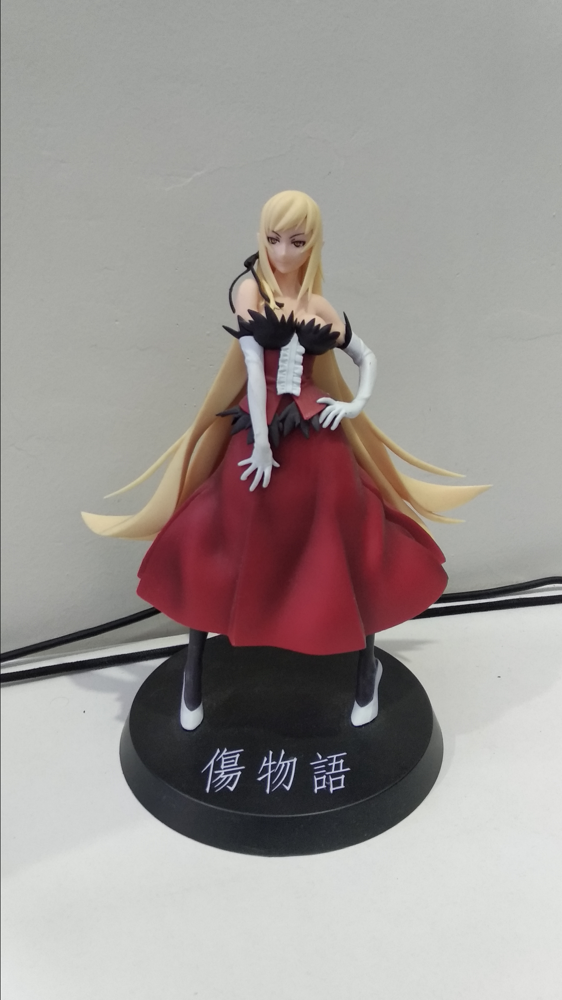

In [5]:
img, im_array = open_img("data/IMG.jpg")
display(img)

## Delay Algorithm

In [7]:
@njit
def feedback_delay(
    im_array: np.ndarray, feedback=0.5, wet=0.5, repeats=3
) -> np.ndarray:
    im_delay = np.empty(im_array.shape)
    delay = int(im_array.shape[1] / repeats)
    buffer = np.zeros((delay, 3))
    p = 0
    for y in range(im_array.shape[0]):
        for x in range(im_array.shape[1]):
            im_delay[y][x] = im_array[y][x] * (1 - wet) + buffer[p] * wet
            buffer[p] = (buffer[p] + im_array[y][x]) * feedback
            p += 1
            if p >= delay:
                p = 0
    return transform_255(im_delay).astype(np.uint8)

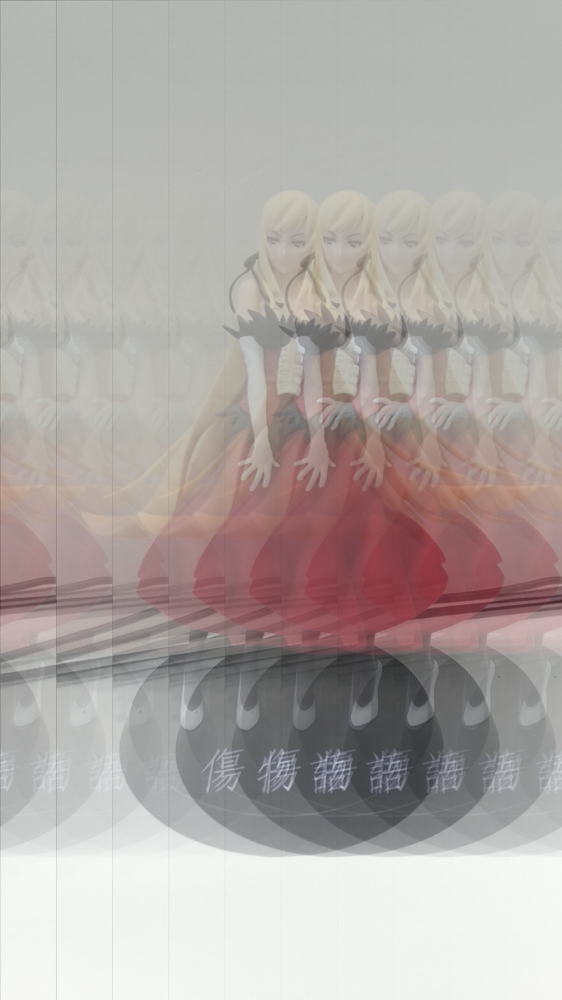

In [12]:
im_delay = feedback_delay(im_array, feedback=0.7, wet=0.6, repeats=10)
plot_image(im_delay)